In [39]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
import holidays
from datetime import datetime
from workalendar.europe import UnitedKingdom
from meteostat import Point, Daily
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error

In [40]:
for holiday in holidays.UnitedKingdom(years=[2009, 2010]).items():
    print(holiday)

(datetime.date(2009, 1, 1), "New Year's Day")
(datetime.date(2009, 1, 2), 'New Year Holiday [Scotland]')
(datetime.date(2009, 3, 17), "St. Patrick's Day [Northern Ireland]")
(datetime.date(2009, 7, 12), 'Battle of the Boyne [Northern Ireland]')
(datetime.date(2009, 8, 3), 'Summer Bank Holiday [Scotland]')
(datetime.date(2009, 11, 30), "St. Andrew's Day [Scotland]")
(datetime.date(2009, 12, 25), 'Christmas Day')
(datetime.date(2009, 4, 10), 'Good Friday')
(datetime.date(2009, 4, 13), 'Easter Monday [England/Wales/Northern Ireland]')
(datetime.date(2009, 5, 4), 'May Day')
(datetime.date(2009, 5, 25), 'Spring Bank Holiday')
(datetime.date(2009, 8, 31), 'Late Summer Bank Holiday [England/Wales/Northern Ireland]')
(datetime.date(2009, 12, 26), 'Boxing Day')
(datetime.date(2009, 12, 28), 'Boxing Day (Observed)')
(datetime.date(2010, 1, 1), "New Year's Day")
(datetime.date(2010, 1, 2), 'New Year Holiday [Scotland]')
(datetime.date(2010, 1, 4), 'New Year Holiday [Scotland] (Observed)')
(dateti

In [41]:
de_holidays = holidays.UnitedKingdom(years=[2009, 2011])
range_of_dates = pd.date_range("2009-12-01", "2011-12-31")
df_holiday = pd.DataFrame(
    data={"date": range_of_dates, "is_holiday": [date in de_holidays for date in range_of_dates]}
)
df_holiday.index = df_holiday['date']
df_holiday = df_holiday.drop(columns=['date'])
df_holiday["is_holiday"] = df_holiday["is_holiday"].astype(int)
df_holiday.head()

,is_holiday
date,
2009-12-01,0
2009-12-02,0
2009-12-03,0
2009-12-04,0
2009-12-05,0


In [42]:
sales = pd.read_pickle('../Data/sales_day.pkl')
sales['date'] = pd.to_datetime(sales['date'])
sales['weekday'] = sales['date'].dt.dayofweek
sales['month'] = sales['date'].dt.month
sales['quarter'] = sales['date'].dt.quarter
sales['day'] = sales['date'].dt.day
sales.index = pd.Series(sales['date'])
sales.head(10)

,date,total_amount,weekday,month,quarter,day
date,,,,,,
2009-12-01,2009-12-01,37366.32,1,12,4,1
2009-12-02,2009-12-02,45644.67,2,12,4,2
2009-12-03,2009-12-03,66327.53,3,12,4,3
2009-12-04,2009-12-04,31448.44,4,12,4,4
2009-12-05,2009-12-05,9042.36,5,12,4,5
2009-12-06,2009-12-06,23171.03,6,12,4,6
2009-12-07,2009-12-07,28482.99,0,12,4,7
2009-12-08,2009-12-08,41667.51,1,12,4,8
2009-12-09,2009-12-09,28832.94,2,12,4,9


In [43]:
sales_holiday = sales.join(df_holiday, how='left')
sales_holiday.head()

,date,total_amount,weekday,month,quarter,day,is_holiday
date,,,,,,,
2009-12-01,2009-12-01,37366.32,1,12,4,1,0
2009-12-02,2009-12-02,45644.67,2,12,4,2,0
2009-12-03,2009-12-03,66327.53,3,12,4,3,0
2009-12-04,2009-12-04,31448.44,4,12,4,4,0
2009-12-05,2009-12-05,9042.36,5,12,4,5,0


In [44]:
range_of_dates = pd.date_range("2009-12-01", "2011-12-31")
start = datetime(2009, 12, 1)
end = datetime(2011, 12, 31)
# london_location = Point(51.5072, 0.1276)
df_weather = Daily('03772', start, end) #weather station code of Heathrow Airport
df_weather = df_weather.fetch()
df_weather['prcp'] = df_weather['prcp'].fillna(method='ffill')
df_weather['wspd'] = df_weather['wspd'].fillna(method='ffill')
df_weather['pres'] = df_weather['pres'].fillna(method='ffill')
df_weather = df_weather[['tavg','prcp', 'wspd', 'pres']]
df_weather.head(5)

,tavg,prcp,wspd,pres
time,,,,
2009-12-01,3.4,9.9,9.7,1011.2
2009-12-02,8.4,0.5,13.9,1011.2
2009-12-03,6.5,13.7,17.9,997.7
2009-12-04,4.6,0.5,14.9,1006.8
2009-12-05,9.9,3.3,18.8,999.3


In [45]:
sales_holiday_weather = sales_holiday.join(df_weather, how='left')
sales_holiday_weather.head()

,date,total_amount,weekday,month,quarter,day,is_holiday,tavg,prcp,wspd,pres
date,,,,,,,,,,,
2009-12-01,2009-12-01,37366.32,1,12,4,1,0,3.4,9.9,9.7,1011.2
2009-12-02,2009-12-02,45644.67,2,12,4,2,0,8.4,0.5,13.9,1011.2
2009-12-03,2009-12-03,66327.53,3,12,4,3,0,6.5,13.7,17.9,997.7
2009-12-04,2009-12-04,31448.44,4,12,4,4,0,4.6,0.5,14.9,1006.8
2009-12-05,2009-12-05,9042.36,5,12,4,5,0,9.9,3.3,18.8,999.3


### OLS

In [46]:
sales_holiday_weather = sales_holiday_weather.reset_index(drop=True)
X = sales_holiday_weather.loc[:,['weekday', 'month', 'is_holiday', 'tavg']].values
y = sales_holiday_weather.loc[:,'total_amount'].values
X = sm.add_constant(X)

model = sm.OLS(y, X).fit()
predictions = model.predict(X)

print_model = model.summary()
print(print_model)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.242
Model:                            OLS   Adj. R-squared:                  0.237
Method:                 Least Squares   F-statistic:                     47.81
Date:                Fri, 03 Mar 2023   Prob (F-statistic):           6.70e-35
Time:                        16:46:07   Log-Likelihood:                -6596.1
No. Observations:                 604   AIC:                         1.320e+04
Df Residuals:                     599   BIC:                         1.322e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.985e+04   1639.285     12.112      0.0

In [47]:
X = sales_holiday_weather.loc[:,['weekday', 'month', 'is_holiday', 'tavg']].values.tolist()
y = sales_holiday_weather.total_amount.values.tolist()
X = sm.add_constant(X)

X_train = X[0:int(len(X)*0.8)]
X_test_1 = X[int(len(X)*0.8):int(len(X)*0.8)+int(len(X)*0.2/3)]
X_test_2 = X[int(len(X)*0.8)+int(len(X)*0.2/3):int(len(X)*0.8)+int(2*len(X)*0.2/3)]
X_test_3 = X[int(len(X)*0.8)+int(2*len(X)*0.2/3):]

y_train = y[0:int(len(X)*0.8)]
Y_test = y[int(len(X)*0.8):]
Y_test_1 = y[int(len(X)*0.8):int(len(X)*0.8)+int(len(X)*0.2/3)]
Y_test_2 = y[int(len(X)*0.8)+int(len(X)*0.2/3):int(len(X)*0.8)+int(2*len(X)*0.2/3)]
Y_test_3 = y[int(len(X)*0.8)+int(2*len(X)*0.2/3):]

OLS_results = sm.OLS(y_train,X_train).fit()

#In sample predictions
in_sample_predictions_poisson = OLS_results.predict(X_train) 

#Out of sample predictions
out_sample_predictions_OLS_1 = OLS_results.predict(X_test_1)
out_sample_predictions_OLS_2 = OLS_results.predict(X_test_2)
out_sample_predictions_OLS_3 = OLS_results.predict(X_test_3)
out_sample_predictions_OLS = np.concatenate((out_sample_predictions_OLS_1, 
                                                    out_sample_predictions_OLS_2,
                                                    out_sample_predictions_OLS_3), axis = 0)

OLS_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.239
Model:                            OLS   Adj. R-squared:                  0.233
Method:                 Least Squares   F-statistic:                     37.52
Date:                Fri, 03 Mar 2023   Prob (F-statistic):           2.66e-27
Time:                        16:46:07   Log-Likelihood:                -5208.0
No. Observations:                 483   AIC:                         1.043e+04
Df Residuals:                     478   BIC:                         1.045e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.035e+04   1507.076     13.501      0.000    1.74e+04    2.33e+04
x1         -1435.0805    275.404     -5.211      0.000   -1976.232    -893.929
x2          1706.1242    158.619     10.756      0.000    1394.447    2017.801
x3         -3674.3349   4206.804     -0.873      0.383   -1.19e+04    4591.780
x4          -356.0932     88.984     -4.002      0.000    -530.941    -181.246
==============================================================================
Omnibus:                      226.538   Durbin-Watson:                   1.378
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1871.089
Skew:                           1.848   Prob(JB):                         0.00
Kurtosis:                      11.906   Cond. No.                         107.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [48]:
# Train test split with 80/20 with last 20% data as the test when order is needed
X_train = X[0:int(len(X)*0.8)]; X_test = X[int(len(X)*0.8):]
y_train = y[0:int(len(X)*0.8)]; Y_test = y[int(len(X)*0.8):]

model = sm.OLS(y_train,X_train).fit()

#In sample predictions
in_sample_predictions = model.predict(X_train) 

#Out of sample predictions
out_sample_predictions = model.predict(X_test)

fig = plt.figure(figsize=(150,70))
ax = plt.subplot()
ax.plot(sales_holiday_weather.loc[0:len(y_train)-1,'date'],y_train,'k',linewidth=8)
ax.plot(sales_holiday_weather.loc[0:len(y_train)-1,'date'],in_sample_predictions,'b',linewidth=8)
ax.plot(sales_holiday_weather.loc[len(y_train):,'date'],Y_test,'k--',linewidth=8)
ax.plot(sales_holiday_weather.loc[len(y_train):,'date'],out_sample_predictions,'b--',linewidth=8)
ax.set_xlabel('Time');ax.set_ylabel('Total Sales'); 
ax.legend(['training','in sample predictions','test','out sample predictions'],fontsize=100)
plt.show()

MAP1: 0.6156838583572376
MAP2: 0.34161111981717307
MAP3: 0.22951739493030002


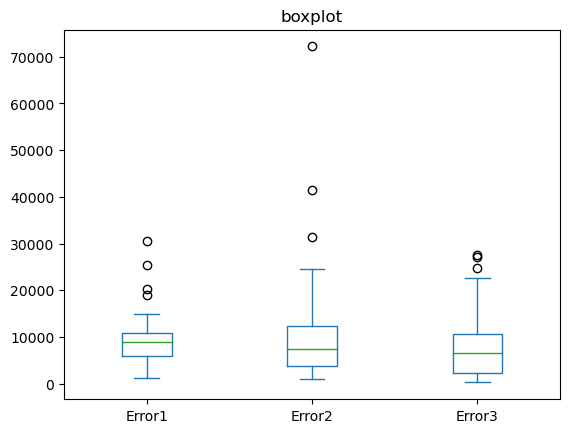

In [49]:
print('MAP1:', mean_absolute_percentage_error(Y_test_1, out_sample_predictions_OLS_1))
print('MAP2:', mean_absolute_percentage_error(Y_test_2, out_sample_predictions_OLS_2))
print('MAP3:', mean_absolute_percentage_error(Y_test_3, out_sample_predictions_OLS_3))

error1 = abs(Y_test_1-out_sample_predictions_OLS_1)
error2 = abs(Y_test_2-out_sample_predictions_OLS_2)
error3 = abs(Y_test_3-out_sample_predictions_OLS_3)

data = pd.DataFrame({"Error1": error1, "Error2": error2, "Error3": error3[:-1]})

# Plot the dataframe
ax = data[['Error1', 'Error2', 'Error3']].plot(kind='box', title='boxplot')

# Display the plot
plt.show()

In [50]:
print(mean_absolute_percentage_error(Y_test, out_sample_predictions))

0.39423150676957625


### Poisson

In [51]:
sales_holiday_weather.head()

,date,total_amount,weekday,month,quarter,day,is_holiday,tavg,prcp,wspd,pres
0,2009-12-01,37366.32,1,12,4,1,0,3.4,9.9,9.7,1011.2
1,2009-12-02,45644.67,2,12,4,2,0,8.4,0.5,13.9,1011.2
2,2009-12-03,66327.53,3,12,4,3,0,6.5,13.7,17.9,997.7
3,2009-12-04,31448.44,4,12,4,4,0,4.6,0.5,14.9,1006.8
4,2009-12-05,9042.36,5,12,4,5,0,9.9,3.3,18.8,999.3


In [52]:
X = sales_holiday_weather.loc[:,['weekday', 'month', 'day', 'is_holiday', 'tavg', 'prcp']].values.tolist()
y = sales_holiday_weather.total_amount.values.tolist()
X = sm.add_constant(X)

X_train = X[0:int(len(X)*0.8)]
X_test_1 = X[int(len(X)*0.8):int(len(X)*0.8)+int(len(X)*0.2/3)]
X_test_2 = X[int(len(X)*0.8)+int(len(X)*0.2/3):int(len(X)*0.8)+int(2*len(X)*0.2/3)]
X_test_3 = X[int(len(X)*0.8)+int(2*len(X)*0.2/3):]

y_train = y[0:int(len(X)*0.8)]
Y_test = y[int(len(X)*0.8):]
Y_test_1 = y[int(len(X)*0.8):int(len(X)*0.8)+int(len(X)*0.2/3)]
Y_test_2 = y[int(len(X)*0.8)+int(len(X)*0.2/3):int(len(X)*0.8)+int(2*len(X)*0.2/3)]
Y_test_3 = y[int(len(X)*0.8)+int(2*len(X)*0.2/3):]

poisson_results = sm.GLM(y_train, X_train, family=sm.families.Poisson()).fit()

#In sample predictions
in_sample_predictions_poisson = poisson_results.predict(X_train) 

#Out of sample predictions
out_sample_predictions_poisson_1 = poisson_results.predict(X_test_1)
out_sample_predictions_poisson_2 = poisson_results.predict(X_test_2)
out_sample_predictions_poisson_3 = poisson_results.predict(X_test_3)
out_sample_predictions_poisson = np.concatenate((out_sample_predictions_poisson_1, 
                                                    out_sample_predictions_poisson_2,
                                                    out_sample_predictions_poisson_3), axis = 0)

poisson_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                  483
Model:                            GLM   Df Residuals:                      476
Model Family:                 Poisson   Df Model:                            6
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -1.1266e+06
Date:                Fri, 03 Mar 2023   Deviance:                   2.2476e+06
Time:                        16:46:14   Pearson chi2:                 2.44e+06
No. Iterations:                     5   Pseudo R-squ. (CS):              1.000
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          9.9025      0.001   9188.639      0.000       9.900       9.905
x1            -0.0648      0.000   -404.607      0.000      -0.065      -0.064
x2             0.0678   8.48e-05    799.066      0.000       0.068       0.068
x3            -0.0016   3.61e-05    -44.255      0.000      -0.002      -0.002
x4            -0.1508      0.002    -60.604      0.000      -0.156      -0.146
x5            -0.0110   4.84e-05   -227.653      0.000      -0.011      -0.011
x6             0.0063   8.66e-05     73.164      0.000       0.006       0.007
==============================================================================
"""

In [53]:
fig = plt.figure(figsize=(150,70))
ax = plt.subplot()
ax.plot(sales_holiday_weather.loc[0:len(y_train)-1,'date'],y_train,'k',linewidth=8)
ax.plot(sales_holiday_weather.loc[0:len(y_train)-1,'date'],in_sample_predictions_poisson,'b',linewidth=8)
ax.plot(sales_holiday_weather.loc[len(y_train):,'date'],Y_test,'k--',linewidth=8)
ax.plot(sales_holiday_weather.loc[len(y_train):,'date'],out_sample_predictions_poisson,'b--',linewidth=8)
ax.set_xlabel('Time');ax.set_ylabel('Total Sales'); 
ax.legend(['training','in sample predictions','test','out sample predictions'],fontsize=100)
plt.show()


MAP1: 0.6066989937093616
MAP2: 0.3265555001660344
MAP3: 0.21945322666832173


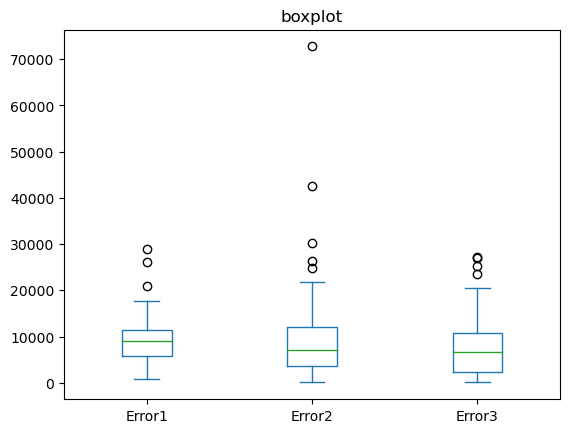

In [54]:
print('MAP1:', mean_absolute_percentage_error(Y_test_1, out_sample_predictions_poisson_1))
print('MAP2:', mean_absolute_percentage_error(Y_test_2, out_sample_predictions_poisson_2))
print('MAP3:', mean_absolute_percentage_error(Y_test_3, out_sample_predictions_poisson_3))

error1 = abs(Y_test_1-out_sample_predictions_poisson_1)
error2 = abs(Y_test_2-out_sample_predictions_poisson_2)
error3 = abs(Y_test_3-out_sample_predictions_poisson_3)

data = pd.DataFrame({"Error1": error1, "Error2": error2, "Error3": error3[:-1]})

# Plot the dataframe
ax = data[['Error1', 'Error2', 'Error3']].plot(kind='box', title='boxplot')

# Display the plot
plt.show()

In [55]:
print(mean_absolute_percentage_error(Y_test, out_sample_predictions_poisson))

0.38287406651584327


### Gamma

In [56]:
X = sales_holiday_weather.loc[:,['weekday', 'month', 'tavg', 'prcp']].values.tolist()
y = sales_holiday_weather.total_amount.values.tolist()
X = sm.add_constant(X)

X_train = X[0:int(len(X)*0.8)]
X_test_1 = X[int(len(X)*0.8):int(len(X)*0.8)+int(len(X)*0.2/3)]
X_test_2 = X[int(len(X)*0.8)+int(len(X)*0.2/3):int(len(X)*0.8)+int(2*len(X)*0.2/3)]
X_test_3 = X[int(len(X)*0.8)+int(2*len(X)*0.2/3):]

y_train = y[0:int(len(X)*0.8)]
Y_test = y[int(len(X)*0.8):]
Y_test_1 = y[int(len(X)*0.8):int(len(X)*0.8)+int(len(X)*0.2/3)]
Y_test_2 = y[int(len(X)*0.8)+int(len(X)*0.2/3):int(len(X)*0.8)+int(2*len(X)*0.2/3)]
Y_test_3 = y[int(len(X)*0.8)+int(2*len(X)*0.2/3):]

Gamma_results = sm.GLM(y_train, X_train, family=sm.families.Gamma()).fit()

#In sample predictions
in_sample_predictions_gamma = Gamma_results.predict(X_train) 

#Out of sample predictions
out_sample_predictions_gamma_1 = Gamma_results.predict(X_test_1)
out_sample_predictions_gamma_2 = Gamma_results.predict(X_test_2)
out_sample_predictions_gamma_3 = Gamma_results.predict(X_test_3)
out_sample_predictions_gamma = np.concatenate((out_sample_predictions_gamma_1, 
                                                    out_sample_predictions_gamma_2,
                                                    out_sample_predictions_gamma_3), axis = 0)

Gamma_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                  483
Model:                            GLM   Df Residuals:                      478
Model Family:                   Gamma   Df Model:                            4
Link Function:          inverse_power   Scale:                         0.21462
Method:                          IRLS   Log-Likelihood:                -5087.3
Date:                Fri, 03 Mar 2023   Deviance:                       98.152
Time:                        16:46:21   Pearson chi2:                     103.
No. Iterations:                     8   Pseudo R-squ. (CS):             0.2872
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       5.318e-05   2.94e-06     18.069      0.000    4.74e-05    5.89e-05
x1          2.698e-06   4.85e-07      5.567      0.000    1.75e-06    3.65e-06
x2         -2.743e-06   2.52e-07    -10.894      0.000   -3.24e-06   -2.25e-06
x3          2.965e-07   1.41e-07      2.103      0.035    2.01e-08    5.73e-07
x4         -2.537e-07   2.49e-07     -1.019      0.308   -7.42e-07    2.34e-07
==============================================================================
"""

In [57]:
fig = plt.figure(figsize=(150,70))
ax = plt.subplot()
ax.plot(sales_holiday_weather.loc[0:len(y_train)-1,'date'],y_train,'k',linewidth=8)
ax.plot(sales_holiday_weather.loc[0:len(y_train)-1,'date'],in_sample_predictions_gamma,'b',linewidth=8)
ax.plot(sales_holiday_weather.loc[len(y_train):,'date'],Y_test,'k--',linewidth=8)
ax.plot(sales_holiday_weather.loc[len(y_train):,'date'],out_sample_predictions_gamma,'b--',linewidth=8)
ax.set_xlabel('Time');ax.set_ylabel('Total Sales'); 
ax.legend(['training','in sample predictions','test','out sample predictions'],fontsize=100)
plt.show()


MAP1: 0.6095586376042319
MAP2: 0.31904667445043405
MAP3: 0.21721968116786186


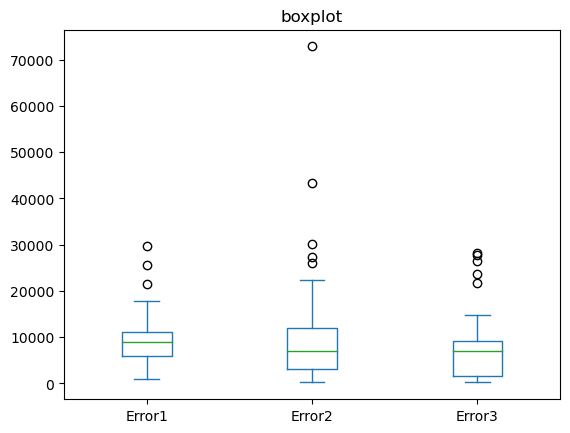

In [58]:
print('MAP1:', mean_absolute_percentage_error(Y_test_1, out_sample_predictions_gamma_1))
print('MAP2:', mean_absolute_percentage_error(Y_test_2, out_sample_predictions_gamma_2))
print('MAP3:', mean_absolute_percentage_error(Y_test_3, out_sample_predictions_gamma_3))

error1 = abs(Y_test_1-out_sample_predictions_gamma_1)
error2 = abs(Y_test_2-out_sample_predictions_gamma_2)
error3 = abs(Y_test_3-out_sample_predictions_gamma_3)

data = pd.DataFrame({"Error1": error1, "Error2": error2, "Error3": error3[:-1]})

# Plot the dataframe
ax = data[['Error1', 'Error2', 'Error3']].plot(kind='box', title='boxplot')

# Display the plot
plt.show()

In [59]:
print(mean_absolute_percentage_error(Y_test, out_sample_predictions))

0.39423150676957625


### Gaussian

In [60]:
X = sales_holiday_weather.loc[:,['weekday', 'month', 'tavg']].values.tolist()
y = sales_holiday_weather.total_amount.values.tolist()
X = sm.add_constant(X)

X_train = X[0:int(len(X)*0.8)]
X_test_1 = X[int(len(X)*0.8):int(len(X)*0.8)+int(len(X)*0.2/3)]
X_test_2 = X[int(len(X)*0.8)+int(len(X)*0.2/3):int(len(X)*0.8)+int(2*len(X)*0.2/3)]
X_test_3 = X[int(len(X)*0.8)+int(2*len(X)*0.2/3):]

y_train = y[0:int(len(X)*0.8)]
Y_test = y[int(len(X)*0.8):]
Y_test_1 = y[int(len(X)*0.8):int(len(X)*0.8)+int(len(X)*0.2/3)]
Y_test_2 = y[int(len(X)*0.8)+int(len(X)*0.2/3):int(len(X)*0.8)+int(2*len(X)*0.2/3)]
Y_test_3 = y[int(len(X)*0.8)+int(2*len(X)*0.2/3):]

Gaussian_results = sm.GLM(y_train, X_train, family=sm.families.Gaussian()).fit()

#In sample predictions
in_sample_predictions_gaussian = Gaussian_results.predict(X_train) 

#Out of sample predictions
out_sample_predictions_gaussian_1 = Gaussian_results.predict(X_test_1)
out_sample_predictions_gaussian_2 = Gaussian_results.predict(X_test_2)
out_sample_predictions_gaussian_3 = Gaussian_results.predict(X_test_3)
out_sample_predictions_gaussian = np.concatenate((out_sample_predictions_gaussian_1, 
                                                    out_sample_predictions_gaussian_2,
                                                    out_sample_predictions_gaussian_3), axis = 0)

Gaussian_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                  483
Model:                            GLM   Df Residuals:                      479
Model Family:                Gaussian   Df Model:                            3
Link Function:               identity   Scale:                      1.3725e+08
Method:                          IRLS   Log-Likelihood:                -5208.4
Date:                Fri, 03 Mar 2023   Deviance:                   6.5744e+10
Time:                        16:46:34   Pearson chi2:                 6.57e+10
No. Iterations:                     3   Pseudo R-squ. (CS):             0.2660
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.018e+04   1493.926     13.505      0.000    1.72e+04    2.31e+04
x1         -1408.5963    273.662     -5.147      0.000   -1944.963    -872.229
x2          1709.2604    158.539     10.781      0.000    1398.529    2019.992
x3          -354.0648     88.931     -3.981      0.000    -528.367    -179.762
==============================================================================
"""

In [61]:
fig = plt.figure(figsize=(150,70))
ax = plt.subplot()
ax.plot(sales_holiday_weather.loc[0:len(y_train)-1,'date'],y_train,'k',linewidth=8)
ax.plot(sales_holiday_weather.loc[0:len(y_train)-1,'date'],in_sample_predictions,'b',linewidth=8)
ax.plot(sales_holiday_weather.loc[len(y_train):,'date'],Y_test,'k--',linewidth=8)
ax.plot(sales_holiday_weather.loc[len(y_train):,'date'],out_sample_predictions,'b--',linewidth=8)
ax.set_xlabel('Time');ax.set_ylabel('Total Sales'); 
ax.legend(['training','in sample predictions','test','out sample predictions'],fontsize=100)
plt.show()

MAP1: 0.6193791791917581
MAP2: 0.34141630385509225
MAP3: 0.22911259384941599


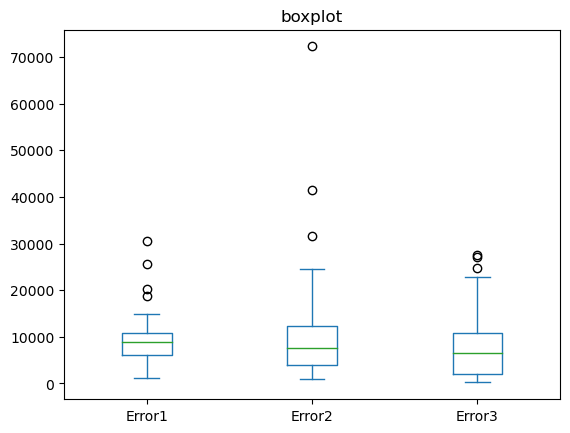

In [62]:
print('MAP1:', mean_absolute_percentage_error(Y_test_1, out_sample_predictions_gaussian_1))
print('MAP2:', mean_absolute_percentage_error(Y_test_2, out_sample_predictions_gaussian_2))
print('MAP3:', mean_absolute_percentage_error(Y_test_3, out_sample_predictions_gaussian_3))

error1 = abs(Y_test_1-out_sample_predictions_gaussian_1)
error2 = abs(Y_test_2-out_sample_predictions_gaussian_2)
error3 = abs(Y_test_3-out_sample_predictions_gaussian_3)

data = pd.DataFrame({"Error1": error1, "Error2": error2, "Error3": error3[:-1]})

# Plot the dataframe
ax = data[['Error1', 'Error2', 'Error3']].plot(kind='box', title='boxplot')

# Display the plot
plt.show()

In [63]:
print(mean_absolute_percentage_error(Y_test, out_sample_predictions))

0.39423150676957625
